In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import bokeh
import subprocess
import command
import os

from dipy.viz import window, actor
from dipy.data import fetch_bundles_2_subjects, read_bundles_2_subjects
from dipy.tracking.streamline import transform_streamlines
from matplotlib.backends.backend_pdf import PdfPages
from bokeh.plotting import figure, show
from bokeh.io import export_png

In [2]:
filename1 = '/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/stats/lh.fat.avg16_syn_bbr.MD_Avg.txt'
data = pd.read_csv(filename1, sep = ' ' , header = 'infer')
data.drop(data.columns[len(data.columns)-1], axis=1, inplace=True)

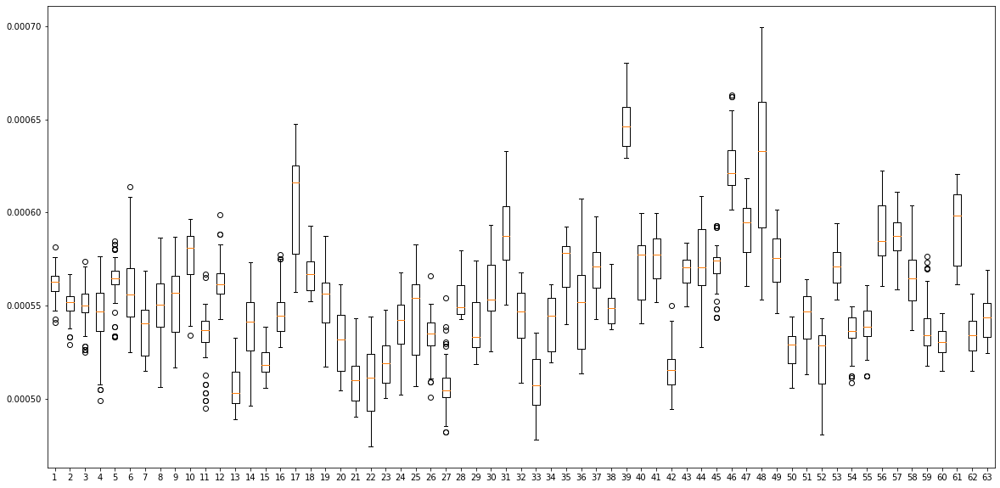

In [3]:
fig = plt.figure(figsize =(20, 10))
plt.boxplot(data)
plt.show()

In [ ]:
# import seaborn as sns
# sns.relplot(x="Indice_x", y="T1-P001", data=g_data, kind="line", height=5, aspect=2.5)

In [4]:
# g = sns.PairGrid(g_data, y_vars=["T1-C001","T1-C002","T1-C003"], x_vars=["Indice_x"],height=4)
# g.map(sns.regplot, color=".3")
# #g.set(ylim=(-1,11), yticks=[0,5,10])
# path_ids = '/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/mris_act/'
# paths_ids_sig = glob.iglob(path_ids+'/*/controles_pacientes/perm.th13.pos.sig.voxel.mgh',recursive=True)
# paths_files_sig = []

# for x in paths_ids_sig:
#     paths_files_sig.append(x)
# paths_files_sig.sort()

# for y in paths_files_sig:
#     os.system("mri_convert --ascii "+y+" "+y+".txt")
    
# paths_ids_sig = glob.iglob(path_ids+'/*/pacientes_controles/perm.th13.pos.sig.voxel.mgh',recursive=True)
# paths_files_sig = []

# for x in paths_ids_sig:
#     paths_files_sig.append(x)
# paths_files_sig.sort()

# for y in paths_files_sig:
#     os.system("mri_convert --ascii "+y+" "+y+".txt")

# print(paths_files_sig)

In [7]:
#################################################################
paths_files_pval_CP = []
paths_files_pval_PC = []
paths_files_stats = []


path_ids = '/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/mris_act/'
paths_ids_CP = glob.iglob(path_ids+'/**/controles_pacientes/perm.th13.pos.sig.voxel.mgh.txt',recursive=True)
paths_ids_PC = glob.iglob(path_ids+'/**/pacientes_controles/perm.th13.pos.sig.voxel.mgh.txt',recursive=True)
paths_stats_inputs = glob.glob('/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/stats/*inputs.txt',recursive=True)
paths_stats_normal = glob.glob('/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/stats/*.txt',recursive=True)
paths_stats = set(paths_stats_normal)-set(paths_stats_inputs)

for filename_pval in paths_ids_CP:
    paths_files_pval_CP.append(filename_pval)
paths_files_pval_CP.sort()
#print(paths_files_pval_CP)

for filename_pval_PC in paths_ids_PC:
    paths_files_pval_PC.append(filename_pval_PC)
    #print(filename_pval_PC)
paths_files_pval_PC.sort()
#print(paths_files_pval_PC)

for filename_stats in paths_stats:
    paths_files_stats.append(filename_stats)
paths_files_stats.sort()
#print(paths_files_stats)

for data in list(range(len(paths_files_stats))):
    data_stats = paths_files_stats[data]
    data_pval_CP = paths_files_pval_CP[data]
    data_pval_PC = paths_files_pval_PC[data]
    
    data_stats_np_CP = np.loadtxt(data_pval_CP, delimiter = ' ')
    p_val_CP = np.copy(data_stats_np_CP)
    p_val_CP[p_val_CP >= 1.3] = True
    p_val_CP[np.logical_not(data_stats_np_CP >= 1.3)] = False
   
    data_stats_np_PC = np.loadtxt(data_pval_PC, delimiter = ' ')
    p_val_PC = np.copy(data_stats_np_PC)
    p_val_PC[p_val_PC >= 1.3] = True
    p_val_PC[np.logical_not(data_stats_np_PC >= 1.3)] = False

    data_data = pd.read_csv(data_stats, sep = ' ' , header = 'infer')
    data_data.drop(data_data.columns[len(data_data.columns)-1], axis=1, inplace=True)
    ctr_data = data_data.iloc[:,0:31]
    pat_data = data_data.iloc[:,31:]
    mean_data_ctr = ctr_data.mean(axis=1).T
    mean_data_pat = pat_data.mean(axis=1).T
    dif_data = mean_data_ctr - mean_data_pat
    data_mean=pd.DataFrame([mean_data_ctr,mean_data_pat,dif_data]).T
    data_mean.columns=['Mean_ctr','Mean_pat','Diferencias']
    # controles vs pacientes
    mean_ctr_pval = np.copy(data_mean.iloc[:,0])
    mean_ctr_pval[p_val_CP == 0] = None
    # pacientes vs controles
    mean_pat_pval = np.copy(data_mean.iloc[:,1])
    mean_pat_pval[p_val_PC == 0] = None
    
    ids = data_stats.split("/",9)
    ids_names_m = np.array(ids)[8]
    sec = ids_names_m.split(".")
    secuence1 = (sec[0]+" "+sec[1])
    secuence2 = (sec[3])
    print(sec)
    if len(sec) <= 4:
        if sec[0] == 'acomm':
            secuence1 = (sec[0])
            secuence2 = (sec[2])
        if sec[0] == 'mcp':
            secuence1 = (sec[0])
            secuence2 = (sec[2])
    bokeh.io.reset_output()
    bokeh.io.output_notebook()
    fig = figure(width=500, height=250,  toolbar_location = None)
    # title=secuence1+" vs "+secuence2, x_axis_label=secuence1, y_axis_label=secuence2, 
    mean_controles = fig.line(range(len(list(data_mean.iloc[:,0]))), data_mean.iloc[:,0], line_width=3)
    mean_pacientes = fig.line(range(len(list(data_mean.iloc[:,0]))), data_mean.iloc[:,1], color = "red", line_dash=[6,3], line_width=3)
    # diff = fig.line(range(len(list(data_mean.iloc[:,0]))),data_mean.iloc[:,2]+0.5, color = "red", line_dash=[6,3])
    trac_p_values = fig.asterisk(range(len(list(data_mean.iloc[:,0]))),mean_ctr_pval*(1.05), size = 15, color = "green")
    trac_p_values2 = fig.asterisk(range(len(list(data_mean.iloc[:,0]))),mean_pat_pval/(1.05), size = 15, color = "black")
    legend = bokeh.models.Legend(items=[
                                            ("Mean Controls",[mean_controles]),
                                            ("Mean Patientes",[mean_pacientes])],
                                            location="top_right")
    legend.click_policy="hide"
    fig.add_layout(legend, "center")
    fig.left[0].formatter.use_scientific = False
    fig.background_fill_color = None 
    fig.border_fill_color = None
    show(fig)
    export_png(fig, filename="/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/mris_act/images2/{}.png".format(secuence1+" vs "+secuence2))
        
    
#################################################################

['acomm', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['acomm', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'bodyc', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'bodyp', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'bodypf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'bodypm', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'bodyt', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'genu', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'rostrum', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['cc', 'splenium', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'af', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'ar', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'atr', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'cbd', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'cbv', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'cst', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'emc', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'fat', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'fx', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'ilf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'mlf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'or', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'slf1', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'slf2', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'slf3', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['lh', 'uf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['mcp', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'af', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'ar', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'atr', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'cbd', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'cbv', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'cst', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'emc', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'fat', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'fx', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'ilf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'mlf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'or', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'slf1', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'slf2', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'slf3', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'AD', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'AD_Avg', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'FA', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'FA_Avg', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'MD', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'MD_Avg', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'RD', 'txt']


Loading BokehJS ...

['rh', 'uf', 'avg16_syn_bbr', 'RD_Avg', 'txt']


Loading BokehJS ...

In [43]:
paths_files_pval_CP = []
paths_files_pval_PC = []
paths_files_stats = []

#/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/mris_act/acomm.AD_Avg.glmdir/controles_pacientes
path_ids = '/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/mris_act/'
paths_ids_CP = glob.iglob(path_ids+'/*/controles_pacientes/perm.th13.pos.sig.voxel.mgh.txt',recursive=True)
paths_ids_PC = glob.iglob(path_ids+'/**/group_patients.diff/perm.th13.pos.sig.voxel.mgh.txt',recursive=True)
paths_stats_inputs = glob.glob('/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/stats/*inputs.txt',recursive=True)
paths_stats_normal = glob.glob('/media/quizhpilema.134643/Datos/Resultados_ELA/DTI/ctr-pac0/stats/*.txt',recursive=True)
paths_stats = set(paths_stats_normal)-set(paths_stats_inputs)

for filename_pval in paths_ids_CP:
    paths_files_pval_CP.append(filename_pval)
    #print(filename_pval)
paths_files_pval_CP.sort()
#print(paths_files_pval_CP)

# for filename_pval_PC in paths_ids_PC:
#     paths_files_pval_PC.append(filename_pval_PC)
# paths_files_pval_PC.sort()
# print(paths_files_pval_PC[200:202])

for filename_stats in paths_stats:
    paths_files_stats.append(filename_stats)
    #print(filename_stats)
paths_files_stats.sort()
#print(paths_files_stats[1:3])

In [8]:
paths_files_pval_CP = []
path_ids = '/opt/dora/Dora/BIDS_ELA/RAW_DATA'
paths_ids_CP = glob.iglob(path_ids+'/*/*t1_mprage',recursive=True)
paths_ids_CP

for filename_pval in paths_ids_CP:
    paths_files_pval_CP.append(filename_pval)
    print(filename_pval)
    
paths_files_pval_CP.sort()
paths_files_pval_CP

[]

In [96]:
count_num = 0
ids_DTI = []
path_ids = '/opt/dora/Dora/BIDS_ELA/RAW_DATA/'
basename_without_ext = os.listdir(path_ids)

for x in basename_without_ext:
    path_completo = path_ids+x
    ids_DTI.append(path_completo)
    
ids_DTI.sort()
print(ids_DTI)

for y in ids_DTI:
    path_completo = os.listdir(y)
    for xx in path_completo:
        path_compl = y+"/"+xx
            # print(path_compl)
            # print(xx)
        if (xx == "Series0008_DTI_64_p2s3_kurtosis_b1000_2000"):
            count_num += 1
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 140):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0011_DTI_64_p2s3_kurtosis_b1000_2000"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 140):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0005_t1_mprage_sag_p2_iso_ns_"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 1):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0022_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0025_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0023_wip_pcasl_conn_L1500_P1500_1seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0022_wip_pcasl_conn_L1500_P1500_1seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0007_t1_mprage_sag_p2_iso_ns_"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 1):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0023_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0024_wip_pcasl_conn_L1500_P1500_1seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0005_t1_mprage_sag_p2_iso_ns"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 1):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0022_wip_pcasl_conn_L1300_P1800_1seg_p2c2"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0026_wip_pcasl_perf_L1800_P1800_3seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 17):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0012_DTI_64_p2s2_kurtosis_b1000_2000"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 140):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0023_wip_pcasl_conn_L1300_P1800_1seg_p2c2"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0026_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0029_wip_pcasl_conn_L1300_P1800_1seg_p2c2"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0032_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0033_wip_pcasl_perf_L1800_P1800_3seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 17):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0028_wip_pcasl_conn_L1300_P1800_1seg_p2c2"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0031_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0032_wip_pcasl_perf_L1800_P1800_3seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 17):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            count_num += 1
        if (xx == "Series0015_DTI_64_p2s3_kurtosis_b1000_2000"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 140):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0018_wip_pcasl_conn_L1300_P1800_1seg_p2c2"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
        if (xx == "Series0031_wip_pcasl_conn_L1500_P1500_1seg"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 81):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            
            
        if (xx == "Series0034_ep2d_bold_resting_p2_s3"):
            count = 0
            for path in os.scandir(path_compl):
                if path.is_file():
                    count += 1
            if (count != 200):
                print("---------------------------------------------------")
            print('File count {}'.format(path_compl), count)
            

['/opt/dora/Dora/BIDS_ELA/RAW_DATA/P003', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/P004', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/P010', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/P012', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/P014-2', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/P021', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C001', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C002', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C003', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C004', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C005', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C006', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C007', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C008', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C009', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C010', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C011', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C012', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C013', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C014', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C015', '/opt/dora/Dora/BIDS_ELA/RAW_DATA/sub-C016', '/opt/dora/Dora/BIDS_ELA/RAW_DA